# FLUXNET-CH4  (no_spin_up)

## 1.Make the nml

### 1.1 Single Point nml

In [2]:
import itertools
import os
import subprocess
import glob, os, shutil, sys
import numpy as np
import pandas as pd
import xarray as xr
import time

def make_namelist(nml_input,nml_output,station_list,mode='no_spin_up',forcing='FLUXNET-CH4'):
    # open nml file and readlines
    with open(nml_input+f'US-Los_{forcing}_{mode}.nml', 'r') as file:
        nml_content = file.readlines()

    path= '/share/home/dq076/data/ME/FLUXNET-CH4/'
    site = f'FLX_{station_list['SITE_ID']}_FLUXNET-CH4_{station_list['YEAR_START']}-{station_list['YEAR_END']}_1-1'
    hh_name = f'FLX_{station_list['SITE_ID']}_FLUXNET-CH4_HH_{station_list['YEAR_START']}-{station_list['YEAR_END']}_1-1.csv'
    name = f"{path}{site}/{hh_name}"
    df = pd.read_csv(name, header=0)

    if df['TIMESTAMP_START'].iloc[0].astype(str)[:4] == str(station_list['YEAR_START']):
        start = str(df['TIMESTAMP_START'].iloc[0])
        end = str(df['TIMESTAMP_START'].iloc[-1])
    else:
        start = str(df['TIMESTAMP_END'].iloc[0])
        end = str(df['TIMESTAMP_END'].iloc[-1])
    start_second = int(start[8:10])*3600+int(start[10:12])*60
    end_second = int(end[8:10])*3600+int(end[10:12])*60

    # modify var
    for i, line in enumerate(nml_content):
        # replace CASE NAME
        if 'DEF_CASE_NAME' in line:
            nml_content[i] = f"DEF_CASE_NAME = '{station_list['SITE_ID']}'\n"
        if 'DEF_simulation_time%start_year' in line:
            nml_content[i] = f"DEF_simulation_time%start_year = {str(station_list['YEAR_START'])}\n"
        if 'DEF_simulation_time%start_month' in line:
            nml_content[i] = f"DEF_simulation_time%start_month = {int(start[4:6])}\n"
        if 'DEF_simulation_time%start_day' in line:
            nml_content[i] = f"DEF_simulation_time%start_day = {int(start[6:8])}\n"
        if 'DEF_simulation_time%start_sec' in line:
            nml_content[i] = f"DEF_simulation_time%start_sec = {start_second}\n"
        if 'DEF_simulation_time%end_year' in line:
            nml_content[i] = f"DEF_simulation_time%end_year = {str(station_list['YEAR_END'])}\n"
        if 'DEF_simulation_time%end_month' in line:
            nml_content[i] = f"DEF_simulation_time%end_month = {int(end[4:6])}\n"
        if 'DEF_simulation_time%end_day' in line:
            nml_content[i] = f"DEF_simulation_time%end_day = {int(end[6:8])}\n"
        if 'DEF_simulation_time%end_sec' in line:
            nml_content[i] = f"DEF_simulation_time%end_sec = {end_second}\n"
        if 'DEF_simulation_time%spinup_year' in line:
            nml_content[i] = f"DEF_simulation_time%spinup_year = {int(station_list['YEAR_START']) - 1}\n"
        if 'SITE_fsitedata' in line:
            nml_content[i] = f"SITE_fsitedata = '{station_list['srfpath']}'\n"
        if 'DEF_dir_output' in line:
            nml_content[i] = f"DEF_dir_output = '/share/home/dq076/data/cases/site/{forcing}/{mode}/'\n"
        if 'DEF_forcing_namelist' in line:
            nml_content[i] = f"DEF_forcing_namelist = '{nml_input}/site/{forcing}/forcing/SINGLE_{station_list['SITE_ID']}.nml'\n"

    # read back modified nml file
    # sometimes need modify nml file path

    new_file_path = f"{nml_output}{station_list['SITE_ID']}.nml"
    with open(new_file_path, 'w') as file:
        file.writelines(nml_content)

if __name__ == '__main__':
    mode='no_spin_up'
    forcing ='FLUXNET-CH4'

    stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist, header=0)
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
    n = len(station_lists['SITE_ID'])
    nml_input = "/share/home/dq076/mode/ME/CoLM202X_CH4_s/run/"
    nml_output = f"{nml_input}site/{forcing}/{mode}/"
    os.makedirs(nml_output, exist_ok=True)
    for i in range(n):
        station_list = station_lists.iloc[i]
        station_list['srfpath'] = f'/share/home/dq076/data/CoLM_Forcing/PLUMBER2/Srfdata/{station_list['SITE_ID']}_{str(station_list['YEAR_START'])}-{str(station_list['YEAR_END'])}_FLUXNET-CH4_Srf.nc'     
        make_namelist(nml_input,nml_output,station_list,mode,forcing)

/tmp/ipykernel_1240002/246234313.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_list['srfpath'] = f'/share/home/dq076/data/CoLM_Forcing/PLUMBER2/Srfdata/{station_list['SITE_ID']}_{str(station_list['YEAR_START'])}-{str(station_list['YEAR_END'])}_FLUXNET-CH4_Srf.nc'
/tmp/ipykernel_1240002/246234313.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_list['srfpath'] = f'/share/home/dq076/data/CoLM_Forcing/PLUMBER2/Srfdata/{station_list['SITE_ID']}_{str(station_list['YEAR_START'])}-{str(station_list['YEAR_END'])}_FLUXNET-CH4_Srf.nc'
/tmp/ipykernel_1240002/246234313.py:80: SettingWithCopyWarning: 
A v

### 1.2 Forcing nml

In [3]:
import itertools
import os
import subprocess
import glob, os, shutil, sys
import numpy as np
import pandas as pd
import xarray as xr
import time

def make_namelist(station_list,mode='no_spin_up',forcing='FLUXNET-CH4'):
    nml_file_path = "/share/home/dq076/mode/ME/CoLM202X_CH4_s/run/forcing/"  # model nml file
    # open nml file and readlines
    with open(nml_file_path+'SINGLE.nml', 'r') as file:
        nml_content = file.readlines()

    # modify var
    for i, line in enumerate(nml_content):
        if 'DEF_forcing%startyr' in line:
            nml_content[i] = f"DEF_forcing%startyr = {str(station_list['YEAR_START'])}\n"
        if 'DEF_forcing%endyr' in line:
            nml_content[i] = f"DEF_forcing%endyr = {str(station_list['YEAR_END'])}\n"
        for j in range(8):
            if f'DEF_forcing%fprefix({j+1})' in line:
                nml_content[i] = f"DEF_forcing%fprefix({j+1}) = '{station_list['forcing_name']}'\n"
    
    pathdir = f"{nml_file_path}../site/{forcing}/forcing/"
    os.makedirs(pathdir, exist_ok=True)
    new_file_path = f"{pathdir}SINGLE_{station_list['SITE_ID']}.nml"
    with open(new_file_path, 'w') as file:
        file.writelines(nml_content)

if __name__ == '__main__':
    forcing='FLUXNET-CH4'
    mode='no_spin_up'

    stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist, header=0)
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
    n = len(station_lists['SITE_ID'])

    for i in range(n):
        station_list = station_lists.iloc[i]
        station_list['forcing_name'] = f'{station_list['SITE_ID']}_{str(station_list['YEAR_START'])}-{str(station_list['YEAR_END'])}_FLUXNET-CH4_Met.nc'     
        make_namelist(station_list,mode,forcing)

/tmp/ipykernel_1240002/1761021912.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_list['forcing_name'] = f'{station_list['SITE_ID']}_{str(station_list['YEAR_START'])}-{str(station_list['YEAR_END'])}_FLUXNET-CH4_Met.nc'
/tmp/ipykernel_1240002/1761021912.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_list['forcing_name'] = f'{station_list['SITE_ID']}_{str(station_list['YEAR_START'])}-{str(station_list['YEAR_END'])}_FLUXNET-CH4_Met.nc'
/tmp/ipykernel_1240002/1761021912.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

## 2.Run the CoLM

In [1]:
import subprocess
import os
from joblib import Parallel, delayed
import glob
from concurrent.futures import ProcessPoolExecutor, as_completed  # 切换到 ProcessPoolExecutor 以支持实时进度

def load_environment(env_file):
    cmd = f'bash -c "source {env_file} && env"'
    result = subprocess.run(cmd, shell=True, capture_output=True, text=True)
    
    new_env = {}
    for line in result.stdout.strip().split('\n'):
        if '=' in line:
            key, value = line.split('=', 1)
            if not key.startswith('BASH_FUNC_'):
                new_env[key] = value
    
    os.environ.update(new_env)
    return os.environ.copy()

def run_colm(run_path, nml_path, log_path, nml_name, updated_env):
    """
    处理单个 nml 文件，返回成功/失败状态（不打印进度，由主脚本处理）。
    """
    nml_file = f'{nml_path}{nml_name}.nml'
    log_file = f'{log_path}{nml_name}.txt'
    
    try:
        # 用 'w' 模式打开文件，重置内容
        with open(log_file, 'w', encoding='utf-8') as log:
            log.write(f"=== 处理 {nml_name}.nml ===\n")
            log.flush()
            
            commands = [
                [f'{run_path}mksrfdata.x', nml_file],
                [f'{run_path}mkinidata.x', nml_file],
                [f'{run_path}colm.x', nml_file]
            ]
            
            for cmd in commands:
                log.write(f"执行命令: {' '.join(cmd)}\n")
                log.flush()
                
                subprocess.run(cmd, 
                               env=updated_env, 
                               stdout=log, 
                               stderr=subprocess.STDOUT, 
                               text=True)
                
                log.write("\n" + "="*50 + "\n")
                log.flush()
            
            log.write(f"=== {nml_name} 处理完成 ===\n")
            log.flush()
        
        return True  # 成功
    except Exception as e:
        # 如果失败，也记录到日志
        with open(log_file, 'w', encoding='utf-8') as log:
            log.write(f"=== {nml_name}.nml 处理失败: {str(e)} ===\n")
        return False

if __name__ == "__main__":
    forcing ='FLUXNET-CH4'
    mode ='no_spin_up'

    env_file = '/share/home/dq089/soft/gnu-env'
    run_path = '/share/home/dq076/mode/ME/CoLM202X_CH4_s/run/'

    nml_path = f'{run_path}site/{forcing}/{mode}/'
    log_path = f'{nml_path}logs/'  
    os.makedirs(log_path, exist_ok=True)

    updated_env = load_environment(env_file)
    
    nml_files = glob.glob(f'{nml_path}*.nml')
    nml_names = [os.path.splitext(os.path.basename(nml_file))[0] for nml_file in nml_files if 'HK-MPM' not in nml_file]
    print(f"发现 {len(nml_files)} 个 .nml 文件：{nml_names}")

    max_workers = min(24, os.cpu_count() or 1)
    with ProcessPoolExecutor(max_workers=max_workers) as executor:
        # 提交所有任务，返回 future 对象
        future_to_nml = {
            executor.submit(run_colm, run_path, nml_path, log_path, nml_name, updated_env): nml_name
            for nml_name in nml_names
        }
        
        # 维护剩余任务集合
        remaining_nml = set(nml_names)
        completed_count = 0
        
        # 实时监控完成
        for future in as_completed(future_to_nml):
            nml_name = future_to_nml[future]
            try:
                success = future.result()
                if success:
                    completed_count += 1
                remaining_nml.discard(nml_name)  # 移除已完成（无论成功/失败）
                
                # 打印进度：总数 + 剩余列表
                print(f"=== {nml_name} 处理完成（成功: {success}) ===")
                print(f"已完成总数: {completed_count}/{len(nml_names)}")
                if remaining_nml:
                    print(f"剩余未处理: {sorted(list(remaining_nml))}")
                else:
                    print("所有任务已完成！")
                print("-" * 50)
                
            except Exception as exc:
                print(f"{nml_name} 执行异常: {exc}")
                remaining_nml.discard(nml_name)
                completed_count += 1  # 视作完成（失败）
                print(f"已完成总数: {completed_count}/{len(nml_names)}")                                                                                                                                                                                                                                 
                if remaining_nml:
                    print(f"剩余未处理: {sorted(list(remaining_nml))}")
                print("-" * 50)
    
    print("批量处理结束。")

发现 79 个 .nml 文件：['US-Tw1', 'US-Tw4', 'US-Uaf', 'ID-Pag', 'US-MRM', 'CH-Cha', 'US-HRA', 'US-ICs', 'FI-Lom', 'US-EML', 'KR-CRK', 'IT-Cas', 'CH-Dav', 'FI-Si2', 'US-LA2', 'US-LA1', 'US-Tw5', 'JP-Mse', 'US-Myb', 'AT-Neu', 'US-NGC', 'US-EDN', 'MY-MLM', 'RU-Ch2', 'DE-Dgw', 'US-ORv', 'DE-SfN', 'US-BZS', 'US-CRT', 'US-A10', 'US-StJ', 'US-Sne', 'US-DPW', 'CA-SCB', 'RU-Cok', 'PH-RiF', 'FR-LGt', 'US-NGB', 'CA-SCC', 'US-Snd', 'RU-Che', 'NZ-Kop', 'US-Bi2', 'BW-Gum', 'US-Srr', 'US-Tw3', 'US-Ho1', 'BR-Npw', 'JP-SwL', 'JP-BBY', 'US-Pfa', 'US-BZF', 'DE-Hte', 'FI-Hyy', 'US-A03', 'US-Los', 'US-Bi1', 'US-Ivo', 'US-Bes', 'RU-Fy2', 'US-MAC', 'US-Twt', 'US-WPT', 'US-BZB', 'US-HRC', 'NL-Hor', 'CH-Oe2', 'DE-Zrk', 'CN-Hgu', 'US-Beo', 'US-NC4', 'BW-Nxr', 'IT-BCi', 'SE-Deg', 'US-OWC', 'FI-Sii', 'US-Atq', 'UK-LBT']
=== US-HRA 处理完成（成功: True) ===
已完成总数: 1/78
剩余未处理: ['AT-Neu', 'BR-Npw', 'BW-Gum', 'BW-Nxr', 'CA-SCB', 'CA-SCC', 'CH-Cha', 'CH-Dav', 'CH-Oe2', 'CN-Hgu', 'DE-Dgw', 'DE-Hte', 'DE-SfN', 'DE-Zrk', 'FI-Hyy', 'FI

## 3.Postprocess

In [5]:
import glob
import os
from joblib import Parallel, delayed
import pandas as pd

def merge(i,station_lists,data_path):
    station_list = station_lists.iloc[i]
    case = station_list['SITE_ID']
    yrstt = station_list['YEAR_START']
    yrend = station_list['YEAR_END']
    history_path = f'{data_path}/{case}/history/'
    postdata_path = f'{data_path}/{case}/postdata/'
    postdata_name = f'{case}_hist_{yrstt}-{yrend}.nc'
    os.makedirs(postdata_path,exist_ok=True)

    nc_files = [f for f in os.listdir(history_path) if f.endswith('.nc')]
    if nc_files:
        if yrstt==yrend:
            os.system(f'cp {history_path}{case}_hist_{yrstt}.nc {postdata_path}{postdata_name}')
        else:
            os.system(f'cdo -O -mergetime {history_path}*.nc {postdata_path}{postdata_name}')

if __name__ == '__main__':
    forcing = 'FLUXNET-CH4'
    mode = 'no_spin_up'

    cases_path = '/share/home/dq076/data/cases/site/'
    data_path = f'{cases_path}/{forcing}/{mode}/'

    stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
    station_lists = pd.read_csv(stnlist, header=0)
    station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)
    
    results = Parallel(n_jobs=24)(delayed(merge)(i,station_lists,data_path) for i in range(station_lists.shape[0]))

cdi  error (cdf__create): /share/home/dq076/data/cases/site//FLUXNET-CH4/no_spin_up//BR-Npw/postdata/BR-Npw_hist_2013-2016.nc: Permission denied


## 4.Draw the plot

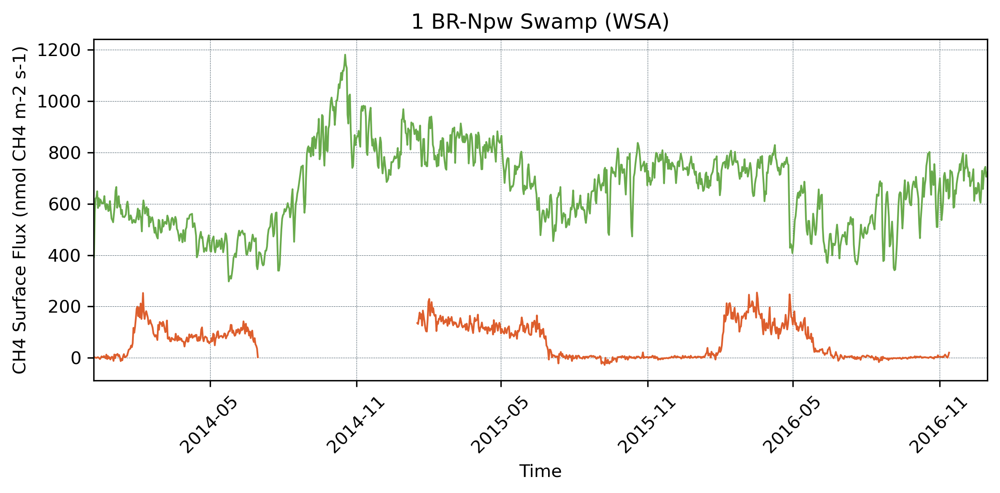

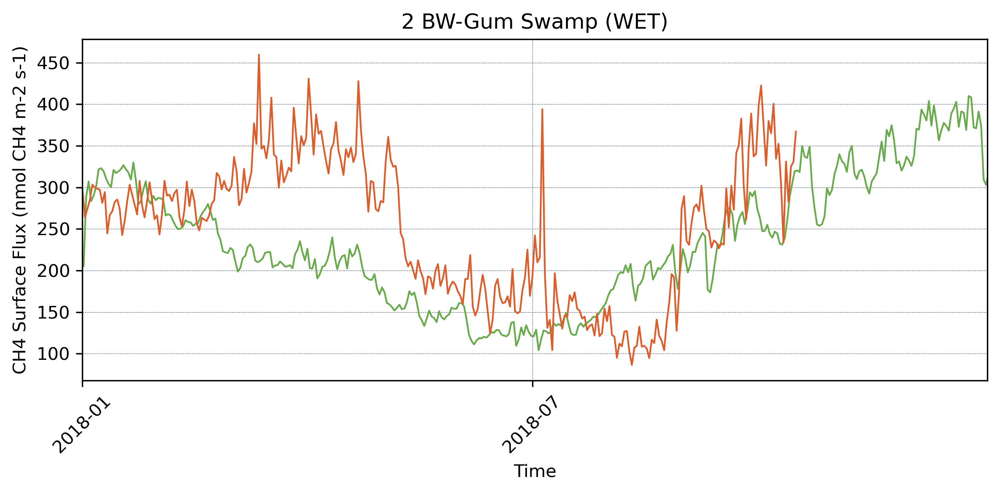

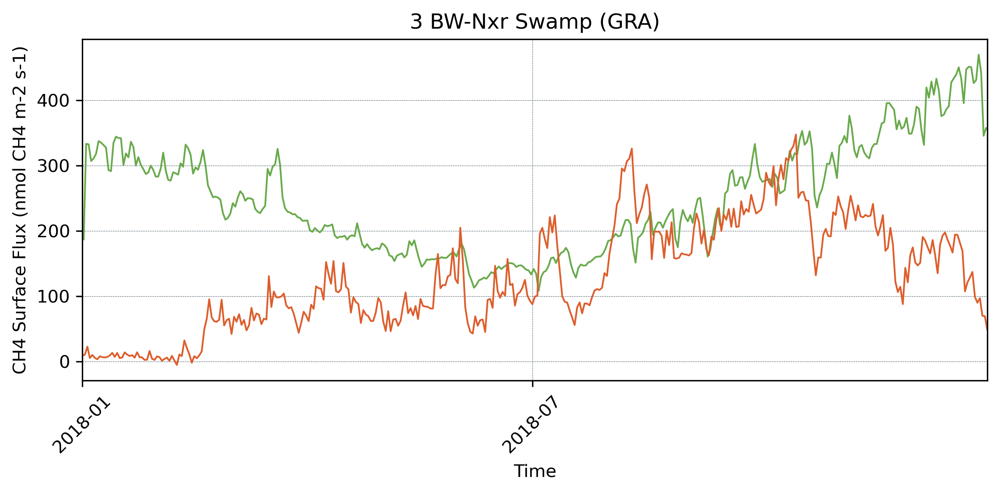

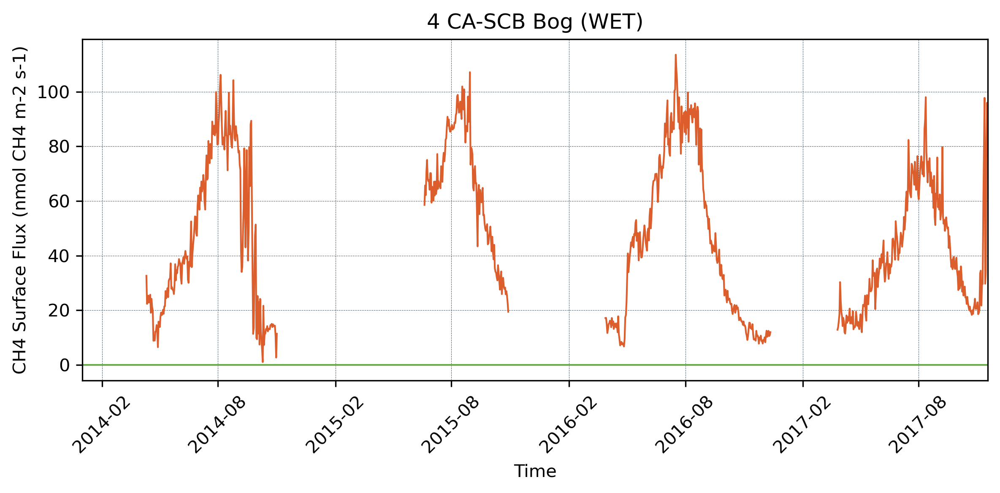

/tmp/ipykernel_4131249/2150132464.py:105: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


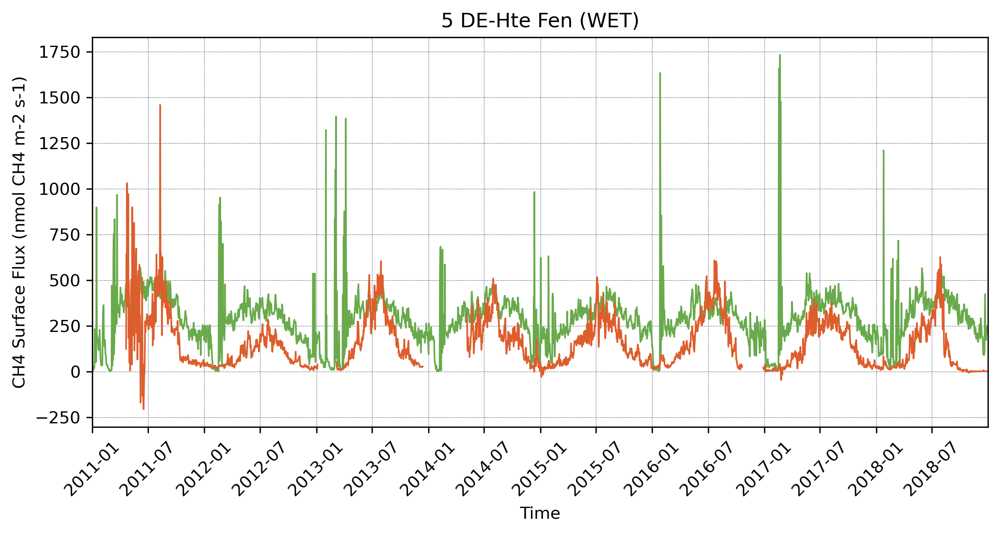

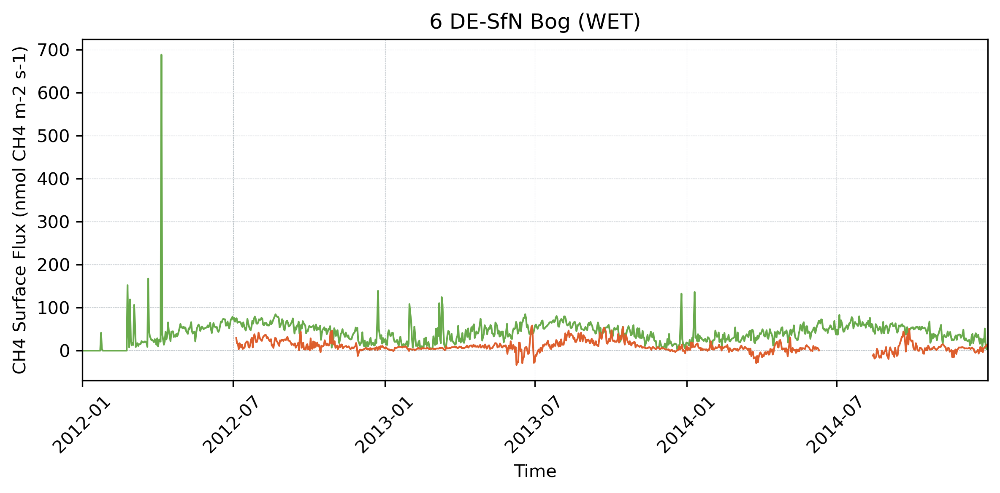

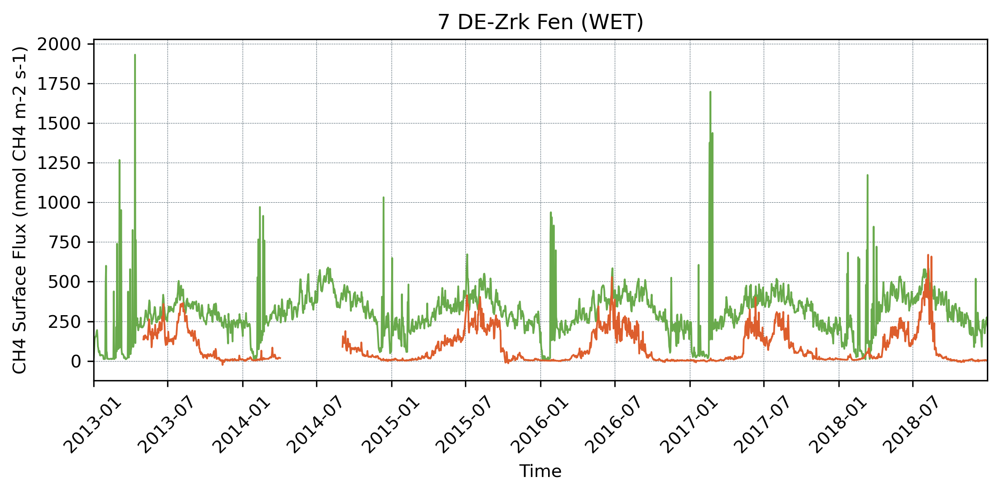

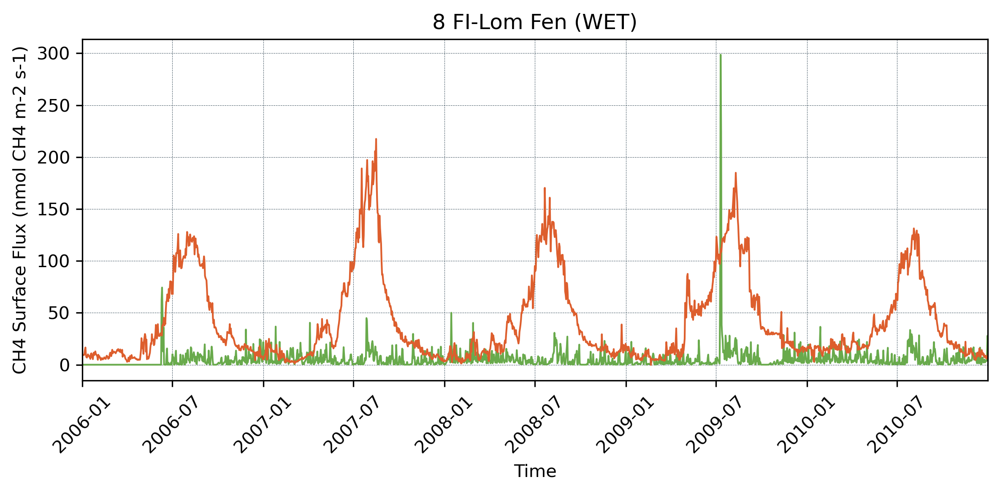

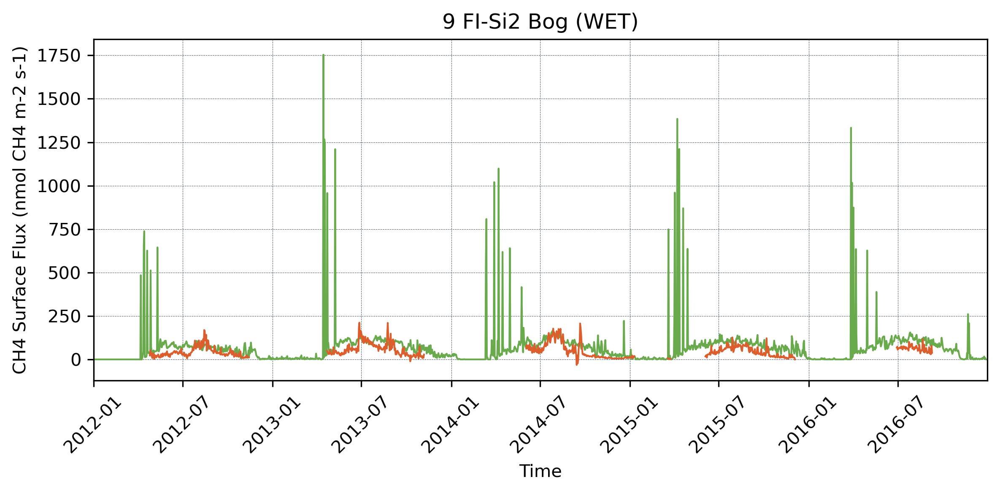

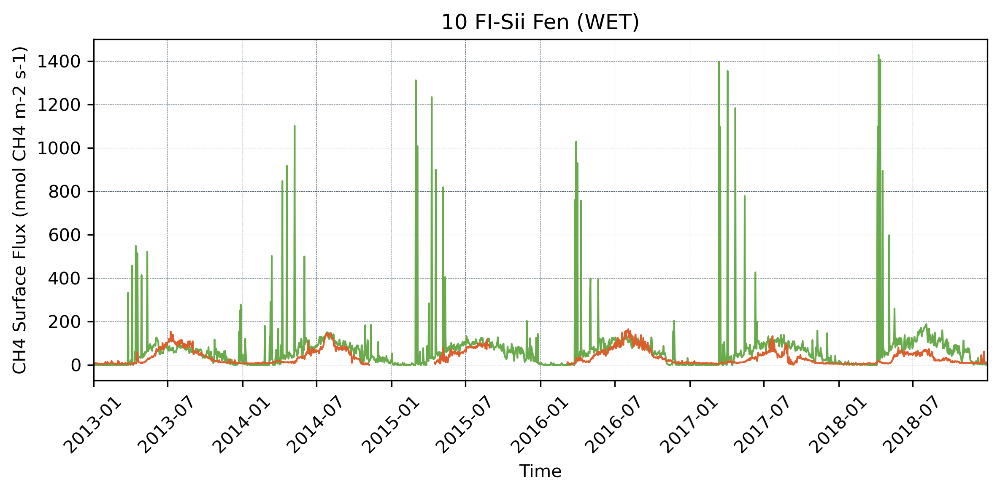

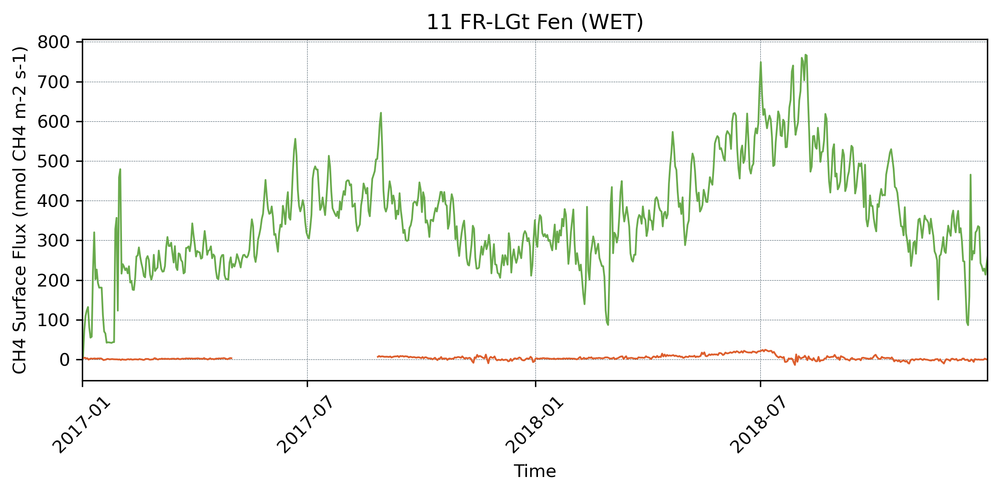

HK-MPM 异常: 无模式结果


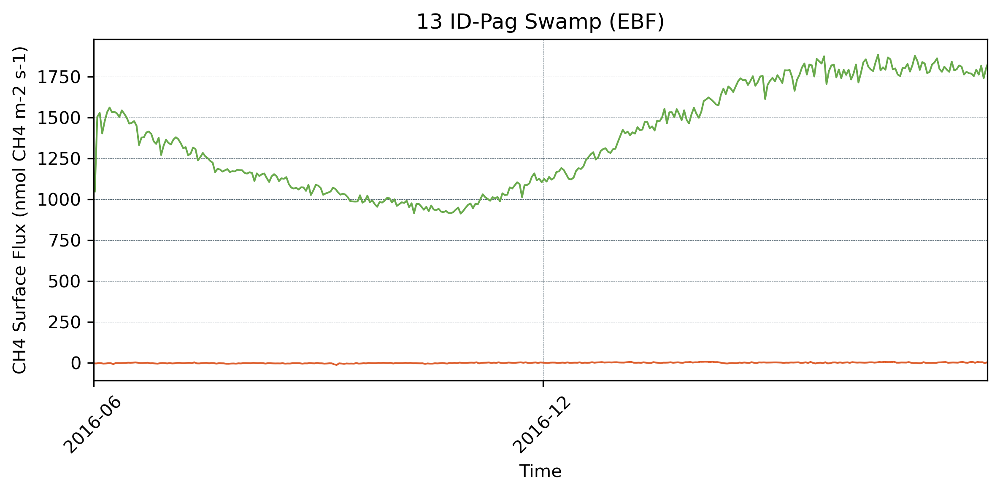

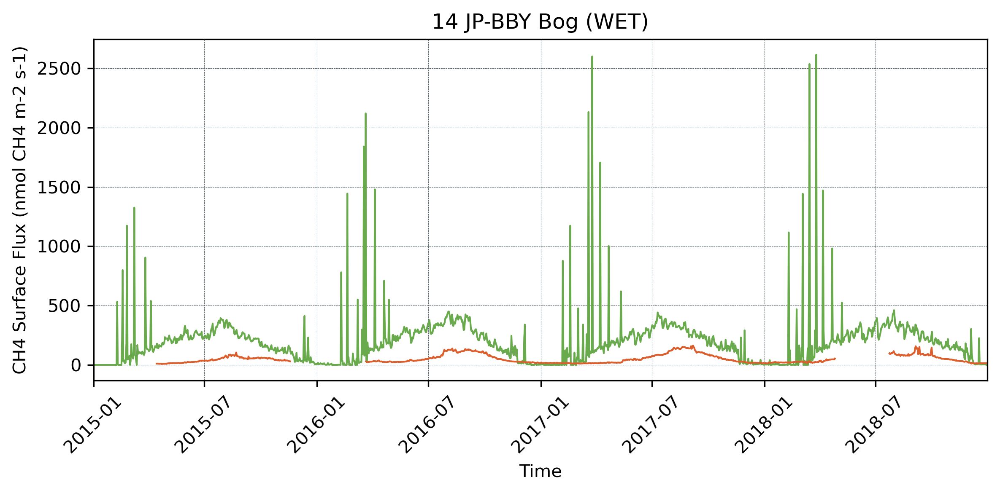

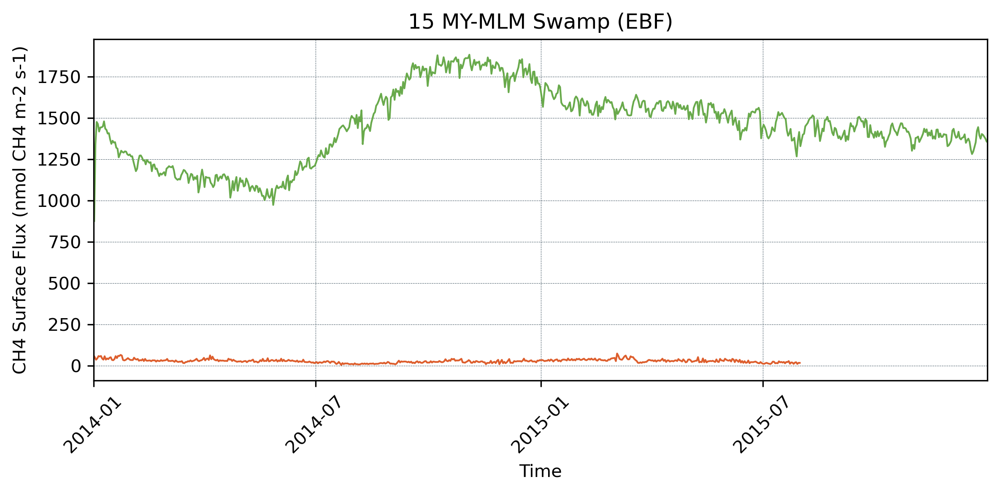

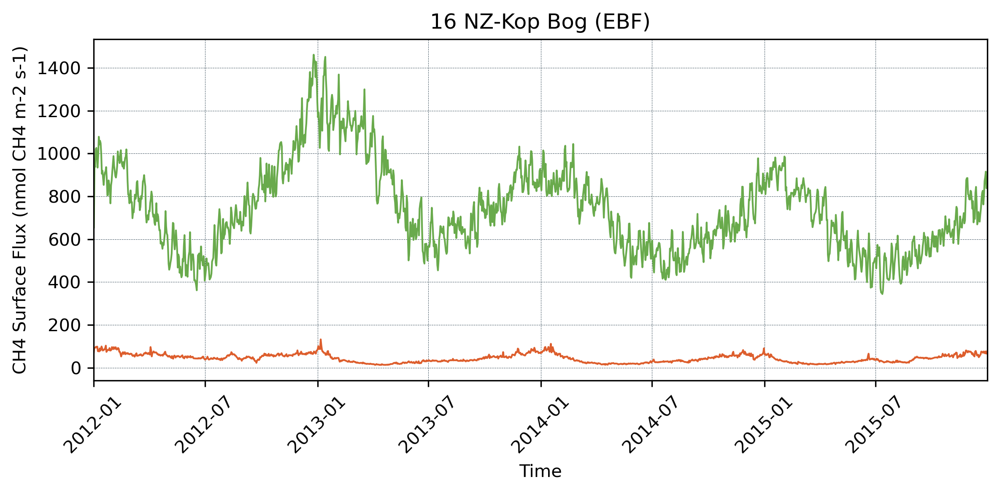

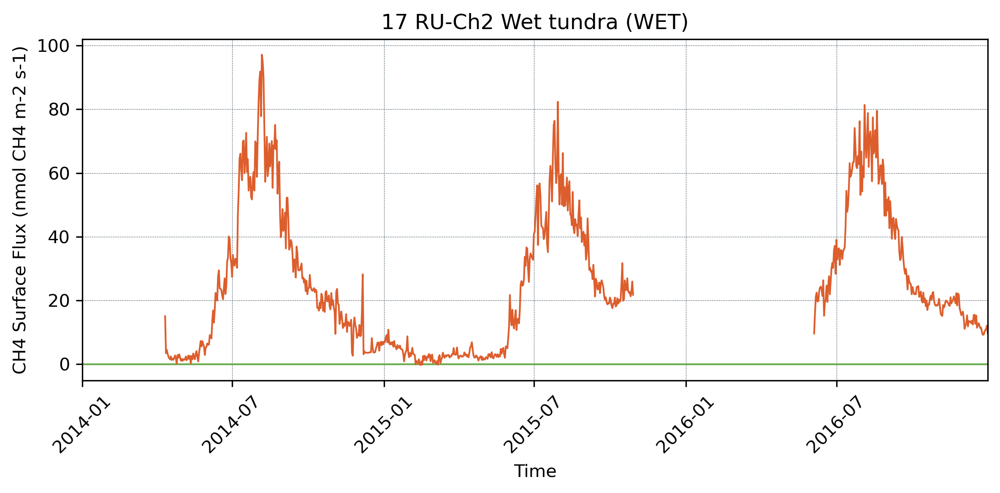

...

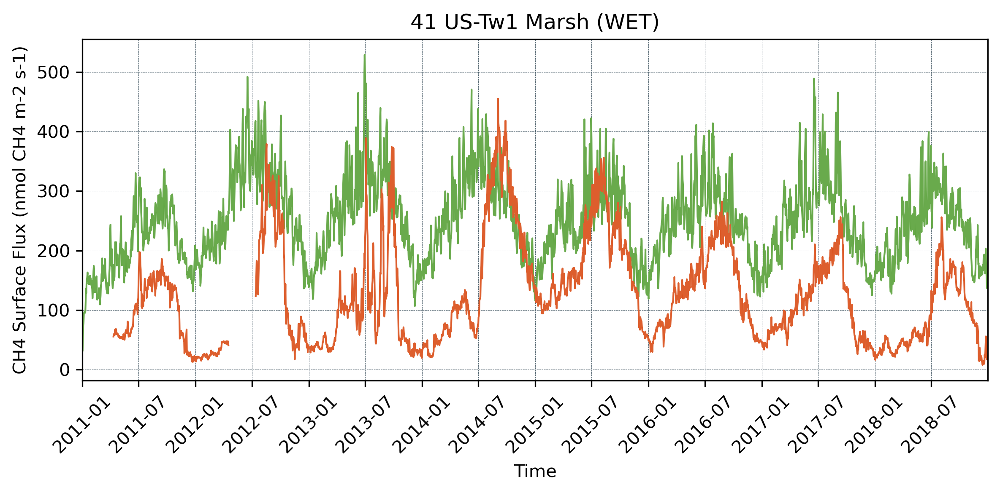

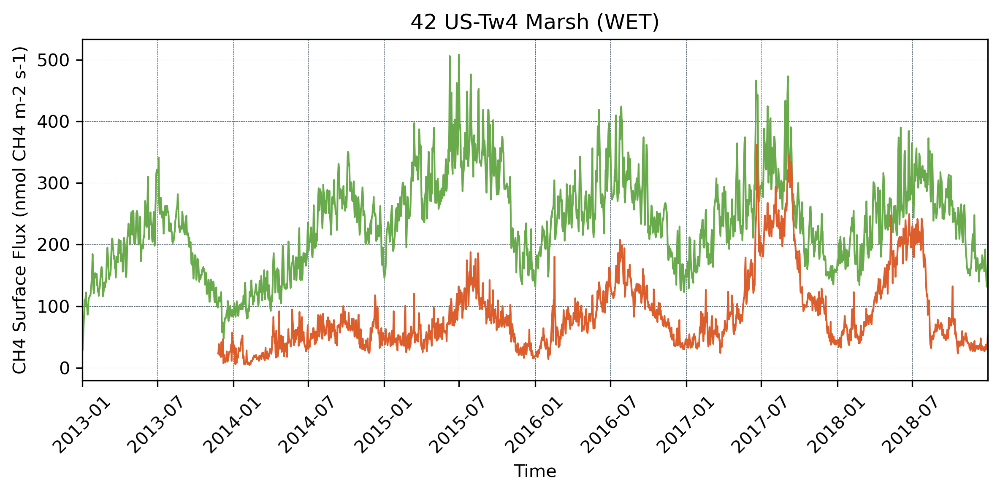

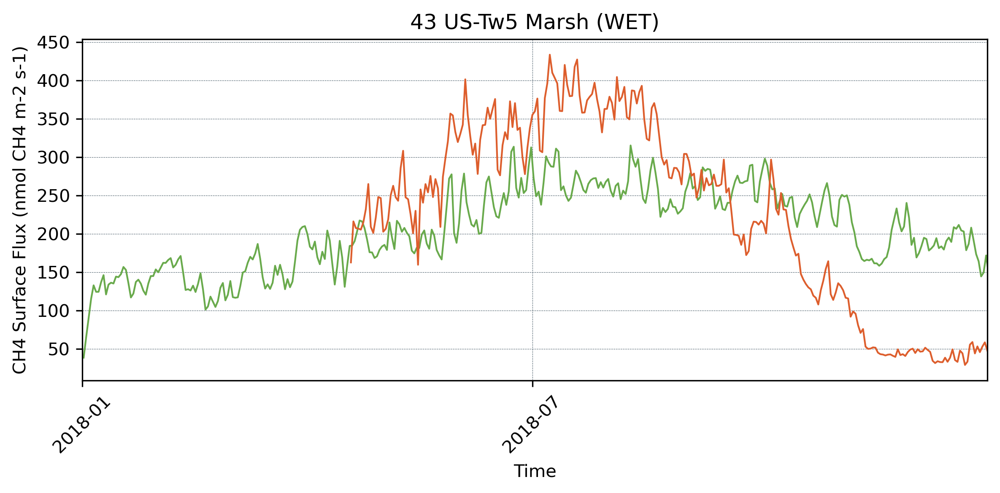

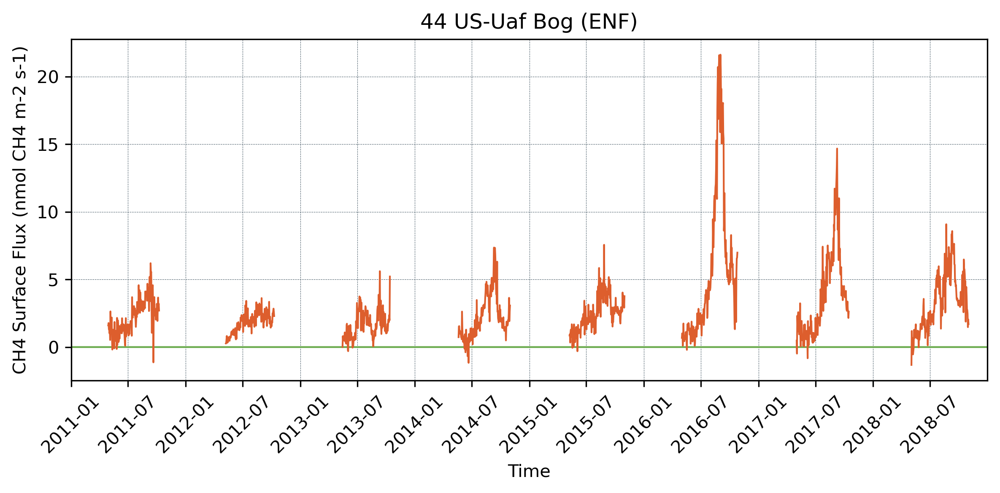

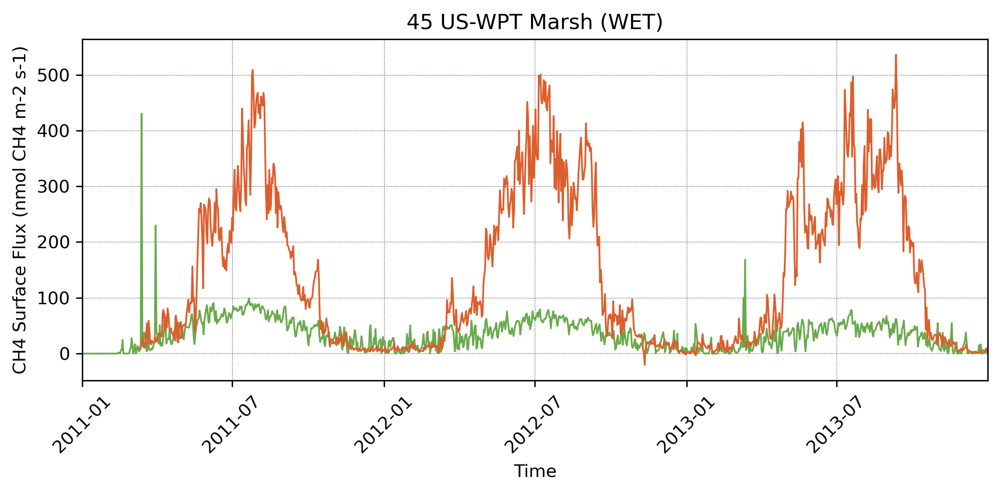

[]
['HK-MPM']
[]
[]


In [3]:
%matplotlib inline

import geopandas as gpd
from pylab import rcParams
import xarray as xr
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.dates import MonthLocator, DateFormatter
import numpy as np
import pandas as pd
import sys

# stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_20201112135337801132.csv"
stnlist = f"/share/home/dq076/data/ME/FLUXNET-CH4/FLX_AA-Flx_CH4-META_wetland.csv"
station_lists = pd.read_csv(stnlist, header=0)
# station_lists = station_lists[station_lists['FLUXNET-CH4_DATA_POLICY'] == 'CCBY4.0'].reset_index(drop=True)

# wetland_list = ['Fen','Swamp','Bog','Mangrove','Marsh','Salt marsh']
# mask = (station_lists['IGBP'] == 'WET') | (station_lists['SITE_CLASSIFICATION'].isin(wetland_list))
# station_lists = station_lists[mask].reset_index(drop=True)

mode = 'no_spin_up'
forcing = 'FLUXNET-CH4'

list1=[]
list2=[]
list3=[]
list4=[]

for i in range(station_lists.shape[0]):
    try:
        station_list = station_lists.iloc[i]
        siteid = station_list['SITE_ID']
        yrstt = station_list['YEAR_START']
        yrend = station_list['YEAR_END']
        igbptyp = station_list['IGBP']
        pfttyp = station_list['SITE_CLASSIFICATION']
        if pfttyp == 'Upland' or pfttyp == 'Drained' and isinstance(station_list['UPLAND_CLASS'], str):
            pfttyp = station_list['UPLAND_CLASS']

        if igbptyp == 'URB' or igbptyp=='SNO' or igbptyp=='WAT':
            list1.append(siteid)
            print(f"{siteid} 异常: 无PFT类型")
            continue

        var = 'ch4_surf_flux_tot'
        var1 = {'ch4_surf_flux_tot':'f_ch4_surf_flux_tot'}
        trans = {'ch4_surf_flux_tot':1/16e6}
        var2 = {'ch4_surf_flux_tot':'FCH4_F'}
        title = {'ch4_surf_flux_tot':'CH4 Surface Flux'}
        ytitle = title
        unit = {'ch4_surf_flux_tot':'nmol CH4 m-2 s-1'}
        path1 = f'/share/home/dq076/data/cases/site/{forcing}/{mode}/{siteid}/postdata/'
        path2 = f'/share/home/dq076/data/ME/FLUXNET-CH4/FLX_{siteid}_FLUXNET-CH4_{yrstt}-{yrend}_1-1/'

        label = ['CoLM','FLUXNET-CH4']
        color = ["#69aa4c","#dd5e2d"]

        data1 = xr.open_dataset(f'{path1}{siteid}_hist_{yrstt}-{yrend}.nc')
        data2 = xr.open_dataset(f'{path2}{siteid}_FLUXNET-CH4_DD.nc')
        # print(data1)
        # print(data2)
        data1 = data1[var1[var]][:,0]*6.25e7
        data2 = data2[var2[var]][:,0,0]
        x = data2['time']

        # 检查 data1 是否全为 0 或 NaN
        data1_values = data1.values
        if np.all((np.isnan(data1_values) | (data1_values == 0))):
            list3.append(siteid)
            print(f"{siteid} 异常: data1 全为 0 或 NaN, 跳过绘制")
            continue

        # list4.append(siteid)
        # print(f"{siteid} 正常")
        # continue

        fig = plt.figure(figsize=(8, 4), dpi=300)
        fig.subplots_adjust(left=0.05, right=0.98, 
                        bottom=0.14, top=0.95, hspace=0.8) 
        gs = GridSpec(2, 48)
        ax = fig.add_subplot(gs[:, :])
        ax.grid(ls = "--", lw = 0.25, color = "#4E616C")
        ax.plot(data1['time'], data1, mfc = "white",lw = 1, ms = 2, color = color[0], label=label[0])
        ax.plot(data2['time'], data2, mfc = "white",lw = 1, ms = 2, color = color[1], label=label[1])
        # ax.set_title(f"{siteid} {mode}  {title[var]} ({unit[var]})")
        ax.set_title(f"{i+1} {siteid} {pfttyp} ({igbptyp})")

        ax.set_xlabel('Time')
        ax.set_ylabel(f"{ytitle[var]} ({unit[var]})")

        ax.xaxis.set_major_locator(MonthLocator(interval=6))
        ax.xaxis.set_major_formatter(DateFormatter('%Y-%m'))
        ax.set_xlim(x[0],x[-1])
        ax.tick_params(axis='x', rotation=45)

        plt.tight_layout()
        plt.show()
    except Exception as exc:
        station_list = station_lists.iloc[i]
        siteid = station_list['SITE_ID']
        list2.append(siteid)
        print(f"{siteid} 异常: 无模式结果")

print(list1)
print(list2)
print(list3)
print(list4)